<h1><big><center> GANs and Diffusion </center></big></h1>

<p align="center">
<img height=300px src="https://cdn-images-1.medium.com/max/1080/0*tJRy5Chmk4XymxwN.png"/></p>
<p align="center"></p>

<h3>Project Overview</h3>

This project explores image generation using generative models, with a focus on understanding how they work under the hood and how to implement them from scratch. The goal is to experiment with different model architectures and training strategies to perform image generation both with and without conditioning (as illustrated in the image above, which shows a generation conditioned by another image).

The work was carried out using an interactive Jupyter notebook, which combines:

- Code implementations of core generative techniques.
- Explanatory notes and reflections to demonstrate a clear understanding of key concepts.
- Hands-on exercises where models are built or completed to explore practical aspects of training generative models.

This project was an opportunity to strengthen my understanding of generative AI through practical implementation, critical thinking, and iterative experimentation—all documented in a single, cohesive notebook.

# Part 1: DC-GAN

In this part, we aim to learn and understand the basic concepts of **Generative Adversarial Networks** through a DCGAN. 


We want to generate handwritten digits using the MNIST dataset. It is available within the torvision package (https://pytorch.org/vision/stable/generated/torchvision.datasets.MNIST.html#torchvision.datasets.MNIST)

Random Seed:  999


100%|██████████| 9.91M/9.91M [00:01<00:00, 5.00MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]
100%|██████████| 1.65M/1.65M [00:06<00:00, 245kB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 5.92MB/s]


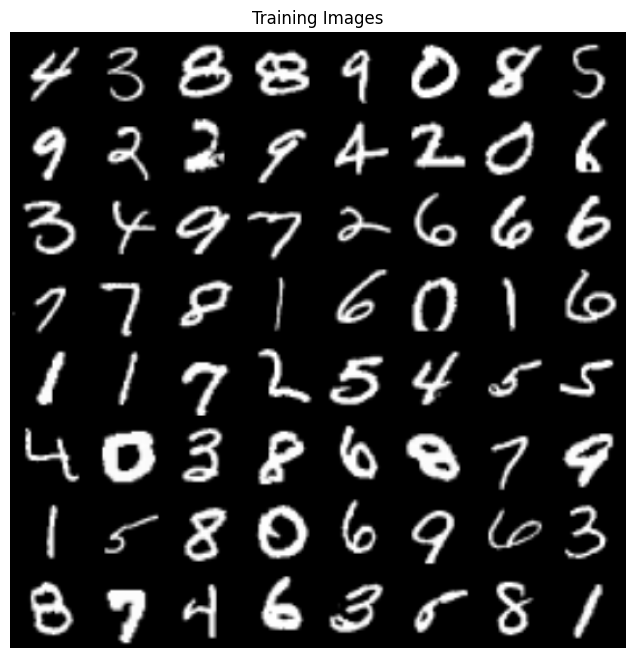

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


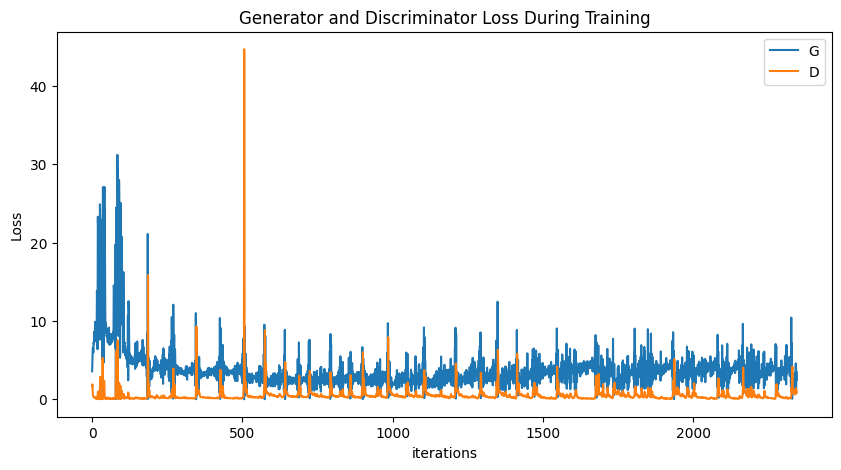

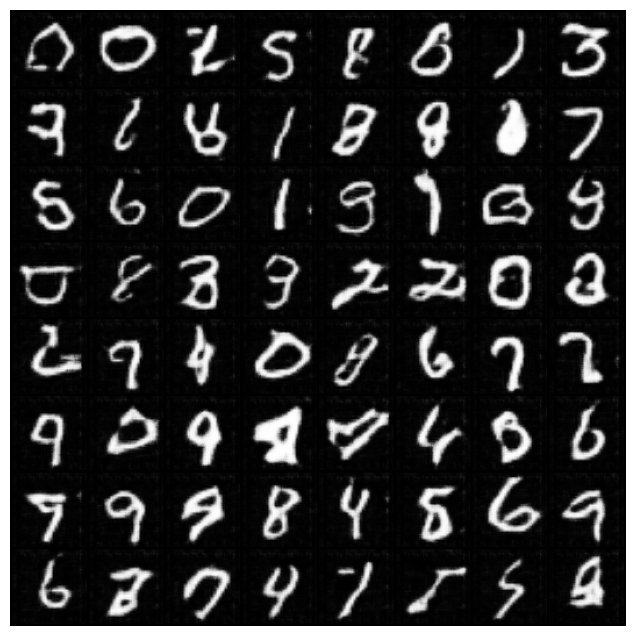

In [ ]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Root directory for dataset
dataroot = "data/mnist"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

dataset = dset.MNIST(root=dataroot, download=True, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Code for the generator
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)


# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
print(netG)

# Discriminator code
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
print(netD)

# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

The results for some images might be convincing, but there are some bad results as well. We will see how we can use different architectures and training objectives to get better results. More importantly, we generate images directly from noise, not knowing what number (if any) will come out on the output.

<b>To control which number the generator should output :</b>

We could concatenate an embedding from the label (the number that we want to generate) to the random latent state vector that is passed to the generator. Then, we have to pass also an embedding from the label to the discriminator. We can add the label information as a new channel to the image passed to the generator. Finally, we should modify the loss functions to take into account the labels.

Then, when we want to create a new image, we should pass the number that we want to generate as the label, which will be embedded and passed to the generator.

Random Seed:  999
Starting Training Loop...
[0/5][0/469]	Loss_D: 1.8994	Loss_G: 6.5031	D(x): 0.6861	D(G(z)): 0.7039 / 0.0460
[0/5][50/469]	Loss_D: 0.5472	Loss_G: 1.4628	D(x): 0.6934	D(G(z)): 0.0214 / 0.3309
[0/5][100/469]	Loss_D: 0.6805	Loss_G: 4.0875	D(x): 0.8445	D(G(z)): 0.3351 / 0.0288
[0/5][150/469]	Loss_D: 1.3803	Loss_G: 6.3574	D(x): 0.9373	D(G(z)): 0.6278 / 0.0046
[0/5][200/469]	Loss_D: 1.5152	Loss_G: 2.0181	D(x): 0.4625	D(G(z)): 0.0832 / 0.1910
[0/5][250/469]	Loss_D: 0.9651	Loss_G: 4.2040	D(x): 0.8220	D(G(z)): 0.4245 / 0.0205
[0/5][300/469]	Loss_D: 0.5713	Loss_G: 3.1283	D(x): 0.7568	D(G(z)): 0.1579 / 0.0569
[0/5][350/469]	Loss_D: 0.7803	Loss_G: 4.2316	D(x): 0.8287	D(G(z)): 0.3818 / 0.0229
[0/5][400/469]	Loss_D: 0.5452	Loss_G: 3.7431	D(x): 0.8313	D(G(z)): 0.2370 / 0.0431
[0/5][450/469]	Loss_D: 0.6505	Loss_G: 2.4229	D(x): 0.7078	D(G(z)): 0.0929 / 0.0985
[1/5][0/469]	Loss_D: 0.5669	Loss_G: 3.2375	D(x): 0.8169	D(G(z)): 0.2506 / 0.0444
[1/5][50/469]	Loss_D: 0.7690	Loss_G: 2.1237	D(x)

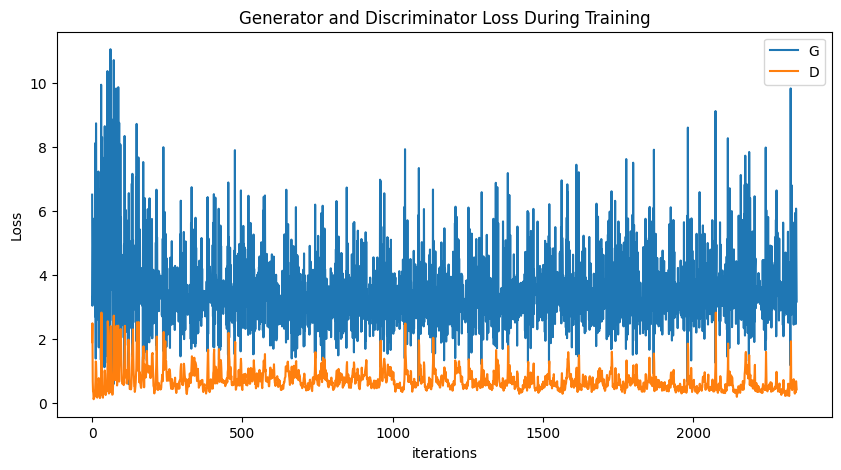

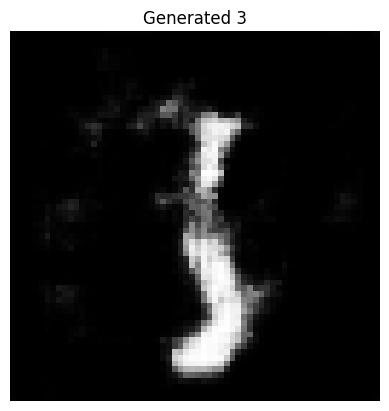

In [ ]:
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

# Root directory for dataset
dataroot = "data/mnist"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 1

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Number of classes in the mnist dataset
n_class = 10

dataset = dset.MNIST(root=dataroot, download=True, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Code for the generator
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu

        # Create the embedding layer
        self.label_emb = nn.Embedding(n_class, nz)

        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz*2, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input, labels):

        label_embedding = self.label_emb(labels)  # Shape: (batch_size, nz)
        x = torch.cat([input.squeeze(-1).squeeze(-1), label_embedding], dim=1)  # Concatenate noise (input) + label embedding to add the label information
        x = x.unsqueeze(2).unsqueeze(3)  # Reshape to (batch_size, nz*2, 1, 1)

        # Now the generator can access to the label information.
        return self.main(x)


# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
#  to ``mean=0``, ``stdev=0.02``.
netG.apply(weights_init)

# Print the model
#print(netG)

# Discriminator code
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()

        # Create the embedding layer
        self.label_emb = nn.Embedding(n_class, image_size*image_size)

        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc+1, ndf, 4, 2, 1, bias=False), # Add the label layer
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input, labels):
        label_embedding = self.label_emb(labels).view(-1, 1, image_size, image_size)  # Reshape to match image size
        x = torch.cat([input, label_embedding], dim=1)  # Concatenate as additional input channel to add the label information
        # Now the discriminator has the label information
        #print("Generator input shape") [128,2,64,64]
        #print(x.shape)
        return self.main(x)

# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-GPU if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the ``weights_init`` function to randomly initialize all weights
# like this: ``to mean=0, stdev=0.2``.
netD.apply(weights_init)

# Print the model
#print(netD)

# Initialize the ``BCELoss`` function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (image, label) in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = image.to(device)
        label_cpu = label.to(device)

        b_size = real_cpu.size(0)
        # print(f"Batch Size : {b_size}") = [128]
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu, label_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise, label_cpu)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach(), label_cpu).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake, label_cpu).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        #if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
        #    with torch.no_grad():
        #        fake = netG(fixed_noise, label_cpu).detach().cpu()
        #    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()



def generate_digit(digit, nz=100):
    noise = torch.randn(1, nz, device=device)  # Generate random noise
    label = torch.tensor([digit], device=device)  # Specify label
    fake_image = netG(noise, label).detach().cpu().squeeze(0).squeeze(0)  # Remove batch/channel dims

    plt.imshow(fake_image, cmap="gray")
    plt.title(f"Generated {digit}")
    plt.axis("off")
    plt.show()

# Generate a fake "3"
generate_digit(3)

# Conditional GAN (cGAN)

Therefore, we do not only want to generate a picture from random noise, but rather generate a picture from another picture. For this purpose we will use a cGAN instead of a vanilla GAN, which was introduced in this [paper](https://arxiv.org/pdf/1611.07004.pdf).

A cGAN is a supervised GAN aiming at mapping a label picture to a real one or a real picture to a label one. As you can see in the diagram below, the discriminator will take as input a pair of images and try to predict if the pair was generated or not. The generator will not generate an image from noise but will intead use an image (label or real) to generate another one (real or label).  

### Generator

In the cGAN architecture, the generator chosen is a U-Net.

A U-Net takes as input an image, and outputs another image.

It can be divided into 2 subparts : an encoder and a decoder.
* The encoder takes the input image and reduces its dimension to encode the main features into a vector.
* The decoder takes this vector and map the features stored into an image.

A U-Net architecture is different from a vanilla convolutional encoder-decoder in that every layer of the decoder takes as input the previous decoded output as well as the output feature map from the encoder layers of the same level. This allows the decoder to map low frequencies information encoded during the descent as well as high frequencies from the original picture.

<p align="center">
<img height=300px src="https://www.researchgate.net/profile/Baris_Turkbey/publication/315514772/figure/fig2/AS:485824962797569@1492841105670/U-net-architecture-Each-box-corresponds-to-a-multi-channel-features-maps-The-number-of.png"/></p>
<p align="center"></p>

The architecture we will implement is the following:

The encoder will take as input a colored picture (3 channels: RGB), it will pass through a series of convolution layers to encode the features of the picture. It will then be decoded by the decoder using transposed convolutional layers. These layers will take as input the previous decoded vector AND the encoded features of the same level.

For this part the objective is to use a cGAN to generate facades from a template image. For this purpose, we will use the "Facade" dataset.

<p align="center">
<img height=250px src="https://storage.googleapis.com/kaggle-datasets-images/926166/1567332/1fd1b7ec805d92b48a1227c376044d0b/dataset-cover.png"/></p>
<p align="center"></p>

Let's start by creating a few classes describing the layers we will use in the U-Net.

In [ ]:
# Importing all the libraries needed
import os
import glob
import torch
import kagglehub
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

from torch import nn
from PIL import Image
from torch.utils.data import Dataset, DataLoader

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)
torch.use_deterministic_algorithms(True) # Needed for reproducible results

Random Seed:  999


In [7]:
# code adapted from https://github.com/milesial/Pytorch-UNet/blob/master/unet/unet_parts.py

# Input layer
class inconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(inconv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

# Encoder layer
class down(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(down, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU(negative_slope=0.2, inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

# Decoder layer
class up(nn.Module):
    def __init__(self, in_ch, out_ch, dropout=False):
        super(up, self).__init__()
        if dropout :
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
                nn.BatchNorm2d(out_ch),
                nn.Dropout(0.5, inplace=True),
                nn.ReLU(inplace=True)
            )
        else:
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True)
            )

    def forward(self, x1, x2):
        x1 = self.conv(x1)
        x = torch.cat([x1, x2], dim=1)
        return x

# Output layer
class outconv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(outconv, self).__init__()
        self.conv = nn.Sequential(
              nn.ConvTranspose2d(in_ch, out_ch, kernel_size=4, padding=1, stride=2),
              nn.Tanh()
        )

    def forward(self, x):
        x = self.conv(x)
        return x

Now let's create the U-Net using the helper classes defined previously.

In [ ]:
class U_Net(nn.Module):
    '''
    Ck denotes a Convolution-BatchNorm-ReLU layer with k filters.
    CDk denotes a Convolution-BatchNorm-Dropout-ReLU layer with a dropout rate of 50%
    Encoder:
      C64   - C128   - C256   - C512  - C512  - C512 - C512 - C512
    Decoder:
      CD512 - CD1024 - CD1024 - C1024 - C1024 - C512 - C256 - C128
    '''
    def __init__(self, n_channels, n_classes):
        super(U_Net, self).__init__()
        # Encoder
        self.inc = inconv(n_channels, 64) # 64 filters
        # Create the 7 encoder layers called "down1" to "down7" following this sequence
        # C64   - C128   - C256   - C512  - C512  - C512 - C512 - C512
        # The first one has already been implemented
        self.down1 = down(64, 128)   # C64 - C128
        self.down2 = down(128, 256)  # C128 - C256
        self.down3 = down(256, 512)  # C256 - C512
        self.down4 = down(512, 512)  # C512 - C512
        self.down5 = down(512, 512)  # C512 - C512
        self.down6 = down(512, 512)  # C512 - C512
        self.down7 = down(512, 512)  # C512 - C512

        # Decoder
        # Create the 7 decoder layers called up1 to up7 following this sequence :
        # CD512 - CD1024 - CD1024 - C1024 - C1024 - C512 - C256 - C128
        # The last layer has already been defined
        self.up7 = up(512, 512, dropout=True)   # CD512 - CD1024
        self.up6 = up(1024, 512, dropout=True)  # CD1024 - CD1024
        self.up5 = up(1024, 512, dropout=True) # CD1024 - C1024
        self.up4 = up(1024, 512) # C1024 - C1024
        self.up3 = up(1024, 256)  # C1024 - C512
        self.up2 = up(512, 128)   # C512 - C256
        self.up1 = up(256, 64)   # C256 - C128

        self.outc = outconv(128, n_classes) # 128 filters

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x6 = self.down5(x5)
        x7 = self.down6(x6)
        x8 = self.down7(x7)
        # At this stage x8 is our encoded vector, we will now decode it
        x = self.up7(x8, x7)
        x = self.up6(x, x6)
        x = self.up5(x, x5)
        x = self.up4(x, x4)
        x = self.up3(x, x3)
        x = self.up2(x, x2)
        x = self.up1(x, x1)
        x = self.outc(x)
        return x

In [8]:
# We take images that have 3 channels (RGB) as input and output an image that also have 3 channels (RGB)
generator = U_Net(3, 3)

# Check that the architecture is as expected
print(generator)

U_Net(
  (inc): inconv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inpla

As said in this notebook, the skip connections allow the decoder to map low frequencies information encoded during the descent as well as high frequencies from the original picture.

The deeper layers encode global features, but local details are lost. The skip connections can add this details (edges and textures) to the decoder.

It helps also with the gradient propagation, helping avoiding the vanishing gradient problem.



In [ ]:
# Check the results
sample_tensor = torch.ones(5, 3, 256,256)
generator.forward(sample_tensor)

torch.Size([5, 512, 1, 1])
torch.Size([5, 1024, 2, 2])


tensor([[[[-6.3039e-01, -9.3115e-01, -1.7475e-01,  ..., -9.6688e-01,
           -1.6537e-01,  1.7066e-01],
          [ 3.1666e-01, -3.7029e-01,  9.6352e-01,  ...,  9.5525e-01,
            8.2109e-01,  4.2626e-01],
          [-9.6451e-01,  1.6698e-01, -9.9098e-01,  ..., -9.7776e-01,
           -9.5653e-01, -7.5852e-01],
          ...,
          [ 6.3846e-01,  9.4282e-01,  9.9358e-01,  ...,  9.7948e-01,
            9.9242e-01,  9.9542e-01],
          [ 2.9804e-01,  9.9996e-01, -8.8132e-01,  ..., -5.0037e-01,
           -9.5039e-01, -7.7631e-01],
          [-2.0238e-02,  1.9199e-01,  8.4132e-01,  ..., -5.0987e-01,
           -8.1710e-01,  9.2138e-01]],

         [[ 8.6059e-01, -7.9560e-01,  7.4909e-01,  ..., -9.4234e-01,
            1.9305e-01, -5.7160e-01],
          [-8.1883e-01, -2.0916e-01,  9.9444e-01,  ...,  6.4839e-01,
            9.9881e-01,  9.0411e-01],
          [ 8.9041e-01,  9.7162e-01, -9.6767e-01,  ..., -7.2810e-01,
            9.9093e-01, -7.0360e-01],
          ...,
     

### Discriminator

In the cGAN architecture, the chosen discriminator is a Patch GAN. Instead of classifying if the whole image is fake or not (binary classification), this discriminator tries to classify if each N × N patch in an image is real or fake.

The size N is given by the depth of the net. According to this table :

| Number of layers | N |
| ---- | ---- |
| 1 | 16 |
| 2 | 34 |
| 3 | 70 |
| 4 | 142 |
| 5 | 286 |
| 6 | 574 |

The number of layers actually means the number of layers with `kernel=(4,4)`, `padding=(1,1)` and `stride=(2,2)`. These layers are followed by 2 layers with `kernel=(4,4)`, `padding=(1,1)` and `stride=(1,1)`.
In our case we are going to create a 70x70 PatchGAN.

Let's first create a few helping classes.

In [ ]:
class conv_block(nn.Module):
    def __init__(self, in_ch, out_ch, use_batchnorm=True, stride=2):
        super(conv_block, self).__init__()
        if use_batchnorm:
            self.conv = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=stride),
                nn.BatchNorm2d(out_ch),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            )
        else:
            self.conv = nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=4, padding=1, stride=stride),
                nn.LeakyReLU(negative_slope=0.2, inplace=True)
            )

    def forward(self, x):
        x = self.conv(x)
        return x


class out_block(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(out_block, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, 1, kernel_size=4, padding=1, stride=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv(x)
        return x

Now let's create the Patch GAN discriminator.
As we want a 70x70 Patch GAN, the architecture will be as follows :
```
1. C64  - K4, P1, S2
2. C128 - K4, P1, S2
3. C256 - K4, P1, S2
4. C512 - K4, P1, S1
5. C1   - K4, P1, S1 (output)
```
Where Ck denotes a convolution block with k filters, Kk a kernel of size k, Pk is the padding size and Sk the stride applied.
*Note :* For the first layer, we do not use batchnorm.

These network has 2769729 learnable parameters.

From conv2D:
(6x4x4+1)x64 +
(64x4x4+1)x128 +
(128x4x4+1)x256 +
(256x4x4+1)x512 +
(512x4x4+1)x1

=  2767809

Plus the norm batch parameters

64x2+128x2+256x2+512x2 = 1920

Total = 2767809 + 1920 = 2769729


In [ ]:
class PatchGAN(nn.Module):
    def __init__(self, n_channels, n_classes):
        super(PatchGAN, self).__init__()
        self.conv1 = conv_block(n_channels, 64)
        self.conv2 = conv_block(64, 128)
        self.conv3 = conv_block(128,256)
        self.conv4 = conv_block(256,512, stride=1)
        # output layer
        self.out = out_block(512, n_classes)

    def forward(self, x1, x2):
        x = torch.cat([x2, x1], dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.out(x)
        return x

In [ ]:
# We have 6 input channels as we concatenate 2 images (with 3 channels each)
discriminator = PatchGAN(6, 1)

total_params = sum(p.numel() for p in discriminator.parameters() if p.requires_grad)

print(f"Total learnable parameters : {total_params}")
print(discriminator)

Total learnable parameters : 2769729
PatchGAN(
  (conv1): conv_block(
    (conv): Sequential(
      (0): Conv2d(6, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv2): conv_block(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv3): conv_block(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (conv4): conv_block(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1),

### Loss functions

The global loss function will be made of 2 parts :
* The vanilla GAN loss, in which the discriminator tries to maximize the probability it correctly classifies reals and fakes and the generator tries to minimize the probability that the discriminator will predict its outputs are fake.
* An auxiliary image reconstruction objective, in which the generator not only has to fool the discriminator, but also generate an image that is near to the ground truth image.

Therefore, the loss can be defined as: $$ G^* = arg\ \underset{G}{min}\ \underset{D}{max}\ \mathcal{L}_{cGAN}(G, D) + \lambda \mathcal{L}_{L1}(G)$$  
In which
$$ \mathcal{L}_{cGAN}(G, D) = \mathbb{E}_{x, y}\big[logD(x, y)\big] + \mathbb{E}_{x, z}\big[log(1 - D(x, G(x, z)))\big] $$
$$ \mathcal{L}_{L1}(G) = \mathbb{E}_{x, y, z}\big[||y - G(x, z)||_1\big] $$

In [ ]:
# Loss functions
criterion_GAN = torch.nn.BCELoss()
criterion_pixelwise = torch.nn.L1Loss()

# Loss weight of L1 pixel-wise loss between translated image and real image
lambda_pixel = 100

### Training and evaluating models

In [ ]:
# parameters
num_epochs = 200        # number of epochs of training
batch_size = 16         # size of the batches
lr = 2e-4               # learning rate
b1 = 0.5                # decay of first order momentum of gradient
b2 = 0.999              # decay of second order momentum of gradient
img_height = 256        # size of image height
img_width = 256         # size of image width
channels = 3            # number of image channels
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Download the Facades dataset


In [ ]:
dataset_path = kagglehub.dataset_download("kokeyehya/cmp-facade-db-base")

print("Path to dataset files:", dataset_path)

100%|██████████| 34.9M/34.9M [00:02<00:00, 12.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/kokeyehya/cmp-facade-db-base/versions/1


Configure the dataloader

In [ ]:
class FacadeDataset(Dataset):
    def __init__(self, root, transforms_=None, mode='train'):
        self.transform = transforms.Compose(transforms_)
        self.images_path = sorted(glob.glob(root + '/base/*.jpg'))

        if mode == 'train':
            self.images_path = self.images_path[:int(len(self.images_path) * 0.95)]
        elif mode == 'val':
            self.images_path = self.images_path[int(len(self.images_path) * 0.95):]
        else:
            raise Exception('Invalid mode! It must be either train or val')

        self.masks_path = [image.split(".jpg")[0] + ".png" for image in self.images_path]
        assert len(self.images_path) == len(self.masks_path), "Number of images and masks must be the same"


    def __getitem__(self, index):
        img = Image.open(self.images_path[index])
        mask = Image.open(self.masks_path[index])
        mask = mask.convert('RGB')

        img = self.transform(img)
        mask = self.transform(mask)

        return img, mask

    def __len__(self):
        return len(self.images_path)

# Configure dataloaders
transforms_ = [transforms.Resize((img_height, img_width), Image.BICUBIC),
               transforms.ToTensor()]

dataloader = DataLoader(FacadeDataset(dataset_path, transforms_=transforms_),
                        batch_size=batch_size, shuffle=True, drop_last=True, num_workers=4)

val_dataloader = DataLoader(FacadeDataset(dataset_path, transforms_=transforms_, mode='val'),
                            batch_size=batch_size, shuffle=False)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Check if the loading works and add few helper functions

In [ ]:
def plot2x2Array(image, mask):
    f, axarr = plt.subplots(1, 2)
    axarr[0].imshow(image)
    axarr[1].imshow(mask)

    axarr[0].set_title('Image')
    axarr[1].set_title('Mask')


def reverse_transform(image):
    image = image.numpy().transpose((1, 2, 0))
    image = np.clip(image, 0, 1)
    image = (image * 255).astype(np.uint8)

    return image

def plot2x3Array(image, mask,predict):
    f, axarr = plt.subplots(1,3,figsize=(15,15))
    axarr[0].imshow(image)
    axarr[1].imshow(mask)
    axarr[2].imshow(predict)
    axarr[0].set_title('input')
    axarr[1].set_title('real')
    axarr[2].set_title('fake')

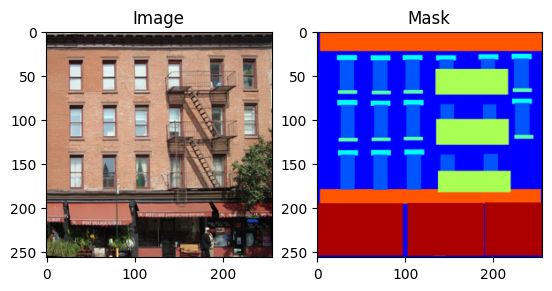

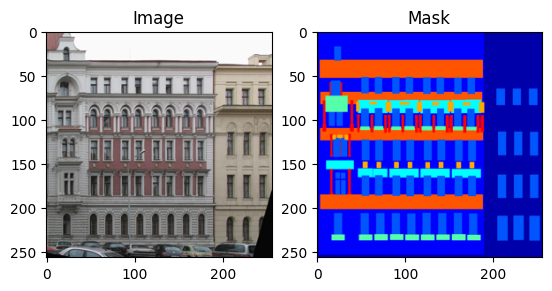

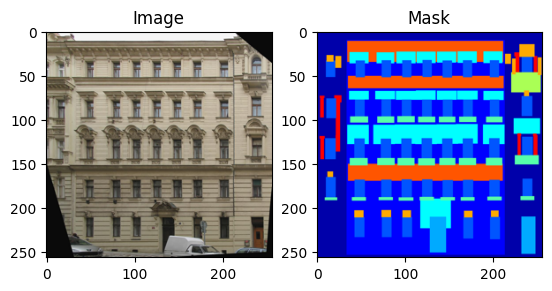

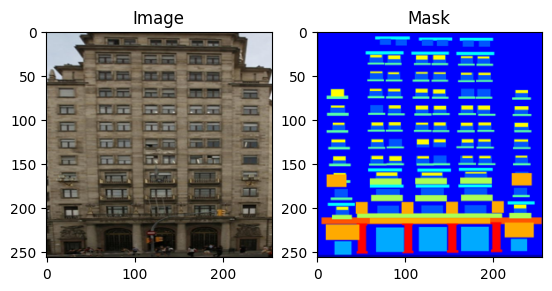

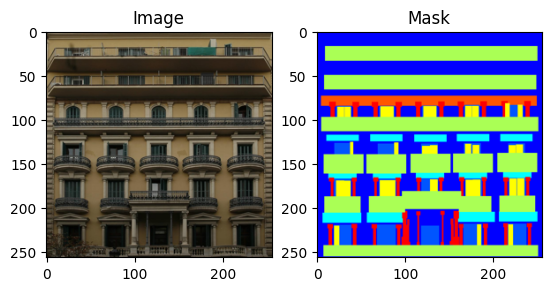

In [ ]:
images, masks = next(iter(dataloader))

for i in range(5):
    image = reverse_transform(images[i])
    mask = reverse_transform(masks[i])
    plot2x2Array(image, mask)

Initialize our GAN

In [ ]:
# Calculate output of image discriminator (PatchGAN)
patch_size = (1, img_height//2**3-2, img_width//2**3-2)

generator = generator.to(device)
discriminator = discriminator.to(device)

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

Additional auxiliary functions

In [ ]:
def save_model(epoch, loss_D, loss_G):
    # save your model weights
    torch.save({
                'epoch': epoch,
                'model_state_dict': generator.state_dict(),
                'optimizer_state_dict': optimizer_G.state_dict(),
                'loss': loss_G,
                }, 'generator_'+str(epoch)+'.pth')
    torch.save({
                'epoch': epoch,
                'model_state_dict': discriminator.state_dict(),
                'optimizer_state_dict': optimizer_D.state_dict(),
                'loss': loss_D,
                }, 'discriminator_'+str(epoch)+'.pth')

def weights_init_normal(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
      torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
  elif classname.find('BatchNorm2d') != -1:
      torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
      torch.nn.init.constant_(m.bias.data, 0.0)

Training the model ! 

In [ ]:
# ----------
#  Training
# ----------

losses = []

# Initialize weights
generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# train the network
discriminator.train()
generator.train()
print_every = 400

for epoch in range(num_epochs):
    for i, batch in enumerate(dataloader):
        # Model inputs
        images, masks = batch
        images = images.to(device)
        masks = masks.to(device)

        # Discriminator labels
        valid = torch.ones((images.size(0), *patch_size), requires_grad=False).to(device)
        fake = torch.zeros((images.size(0), *patch_size), requires_grad=False).to(device)

        # ------------------
        #  Train Generators
        # ------------------

        optimizer_G.zero_grad()

        generated_images = generator(masks) # This line was missing


        # GAN loss
        gan_loss = criterion_GAN(discriminator(generated_images.detach(), masks), valid)

        # Pixel-wise loss
        pixel_loss = criterion_pixelwise(generated_images, images)
        # Total loss
        loss_G = 0.5*(pixel_loss + gan_loss)

        loss_G.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Real loss
        pred_real = discriminator(images, masks)
        loss_real = criterion_GAN(pred_real, valid)

        # Fake loss
        pred_fake = discriminator(generated_images.detach(), masks)
        loss_fake = criterion_GAN(pred_fake, fake)

        # Total loss
        loss_D = 0.5 * (loss_real + loss_fake)

        loss_D.backward()
        optimizer_D.step()

        # Print some loss stats
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}][{i}/{len(dataloader)}] | d_loss: {loss_D.item():6.4f} | g_loss: {loss_G.item():6.4f}')

    # Keep track of discriminator loss and generator loss
    losses.append((loss_D.item(), loss_G.item()))

    if (epoch + 1) % 100 == 0:
        print('Saving model...')
        save_model(epoch+1, loss_D, loss_G)


Epoch [1/200][0/22] | d_loss: 0.8844 | g_loss: 0.5099
Epoch [2/200][0/22] | d_loss: 0.5792 | g_loss: 0.5312
Epoch [3/200][0/22] | d_loss: 0.1054 | g_loss: 1.3309
Epoch [4/200][0/22] | d_loss: 0.0588 | g_loss: 1.4195
Epoch [5/200][0/22] | d_loss: 0.0196 | g_loss: 2.0817
Epoch [6/200][0/22] | d_loss: 0.0223 | g_loss: 2.3777
Epoch [7/200][0/22] | d_loss: 0.0075 | g_loss: 2.6470
Epoch [8/200][0/22] | d_loss: 0.0080 | g_loss: 2.6361
Epoch [9/200][0/22] | d_loss: 0.0654 | g_loss: 1.5581
Epoch [10/200][0/22] | d_loss: 0.0156 | g_loss: 2.3048
Epoch [11/200][0/22] | d_loss: 0.0103 | g_loss: 2.3807
Epoch [12/200][0/22] | d_loss: 0.0081 | g_loss: 2.5081
Epoch [13/200][0/22] | d_loss: 0.0060 | g_loss: 2.7321
Epoch [14/200][0/22] | d_loss: 0.0045 | g_loss: 2.8963
Epoch [15/200][0/22] | d_loss: 0.0044 | g_loss: 2.6959
Epoch [16/200][0/22] | d_loss: 0.0036 | g_loss: 2.8373
Epoch [17/200][0/22] | d_loss: 0.0037 | g_loss: 2.8111
Epoch [18/200][0/22] | d_loss: 0.0040 | g_loss: 2.7468
Epoch [19/200][0/22

Observation of the loss along the training

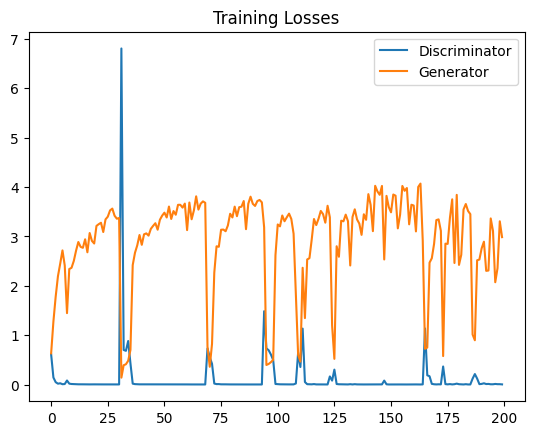

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator')
plt.plot(losses.T[1], label='Generator')
plt.title("Training Losses")
plt.legend()

### Evaluate the cGAN

In [ ]:
def load_model(epoch=200):
    if 'generator_'+str(epoch)+'.pth' in os.listdir() and 'discriminator_'+str(epoch)+'.pth' in os.listdir():
        checkpoint_generator = torch.load('generator_'+str(epoch)+'.pth', map_location=device)
        generator.load_state_dict(checkpoint_generator['model_state_dict'])
        optimizer_G.load_state_dict(checkpoint_generator['optimizer_state_dict'])
        epoch_G = checkpoint_generator['epoch']
        loss_G = checkpoint_generator['loss']

        checkpoint_discriminator = torch.load('discriminator_'+str(epoch)+'.pth', map_location=device)
        discriminator.load_state_dict(checkpoint_discriminator['model_state_dict'])
        optimizer_D.load_state_dict(checkpoint_discriminator['optimizer_state_dict'])
        epoch_D = checkpoint_discriminator['epoch']
        loss_D = checkpoint_discriminator['loss']

    else:
        print('There isn\' a training available with this number of epochs')

In [ ]:
load_model(epoch=200)

# switching mode
generator.eval()

U_Net(
  (inc): inconv(
    (conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down1): down(
    (conv): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down2): down(
    (conv): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (down3): down(
    (conv): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inpla

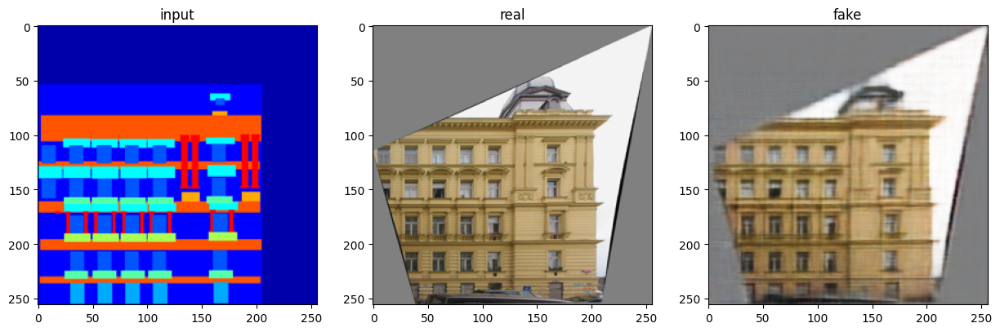

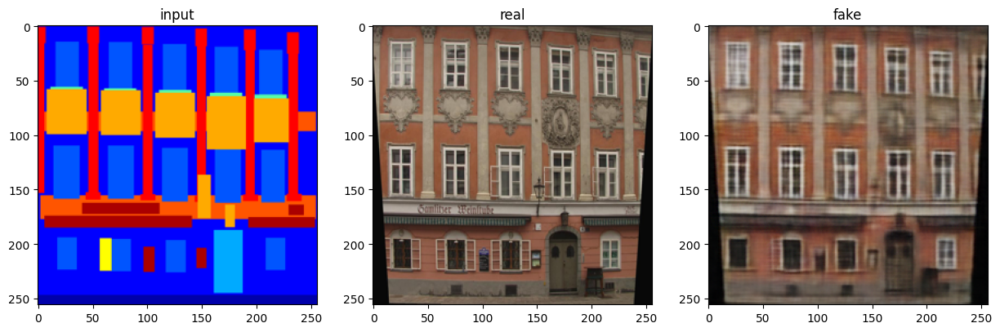

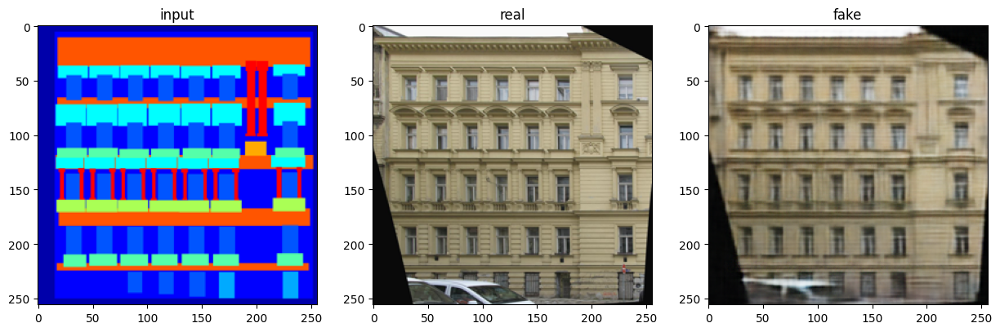

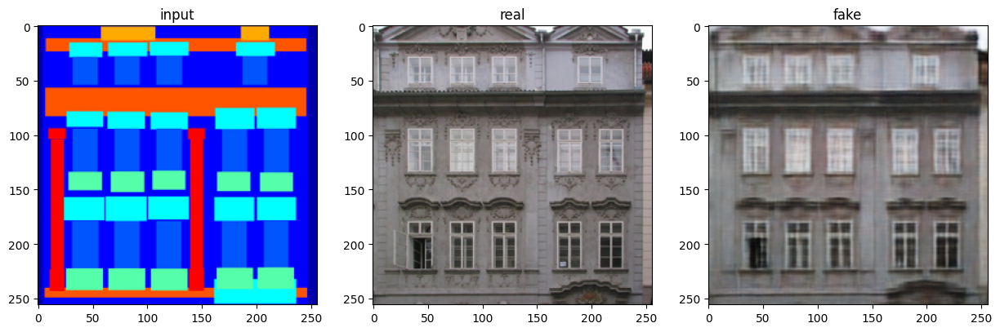

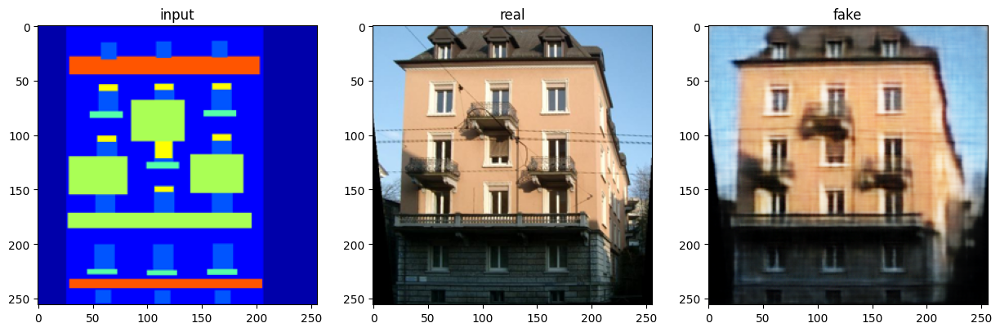

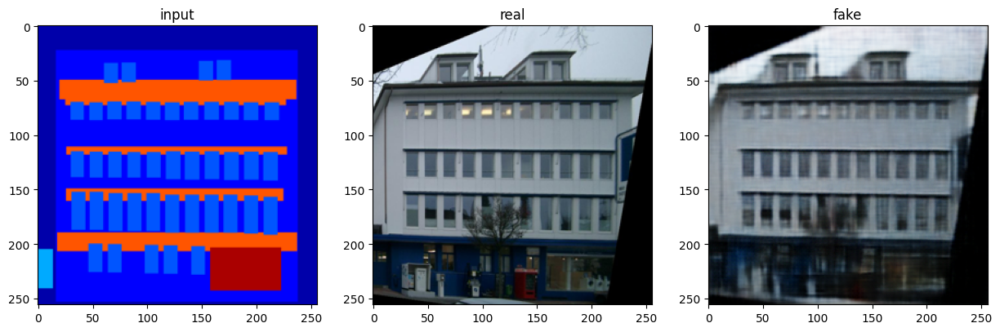

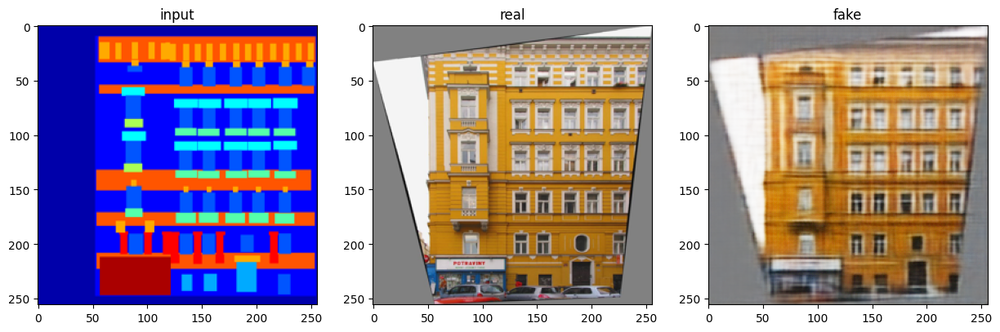

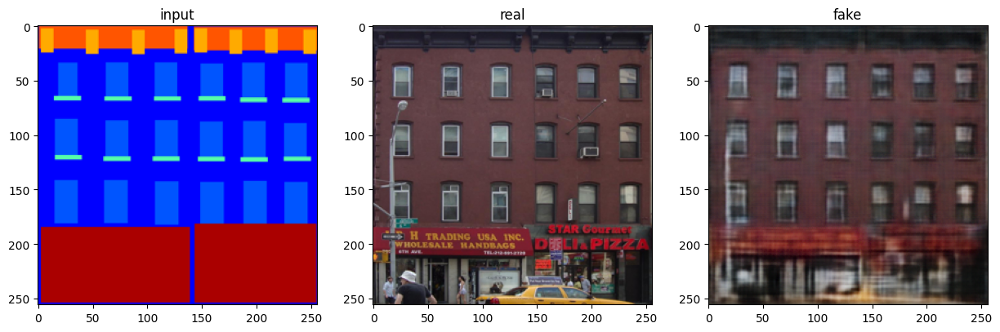

In [ ]:
# show a sample evaluation image on the training base
image, mask = next(iter(dataloader))
output = generator(mask.to(device))
output = output.cpu().detach()

for i in range(8):
    image_plot = reverse_transform(image[i])
    output_plot = reverse_transform(output[i])
    mask_plot = reverse_transform(mask[i])
    plot2x3Array(mask_plot,image_plot,output_plot)

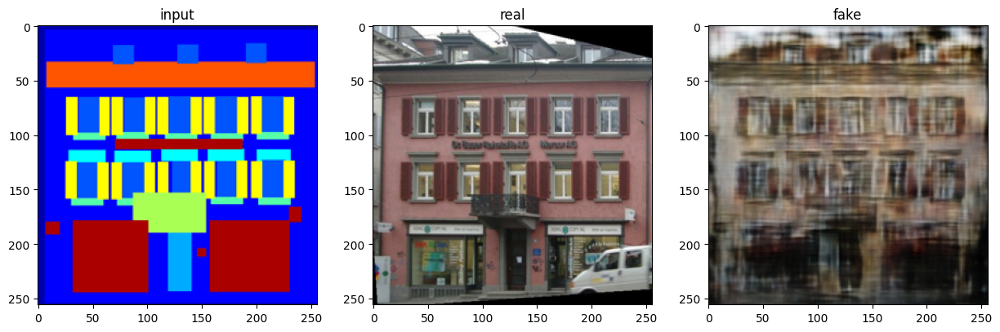

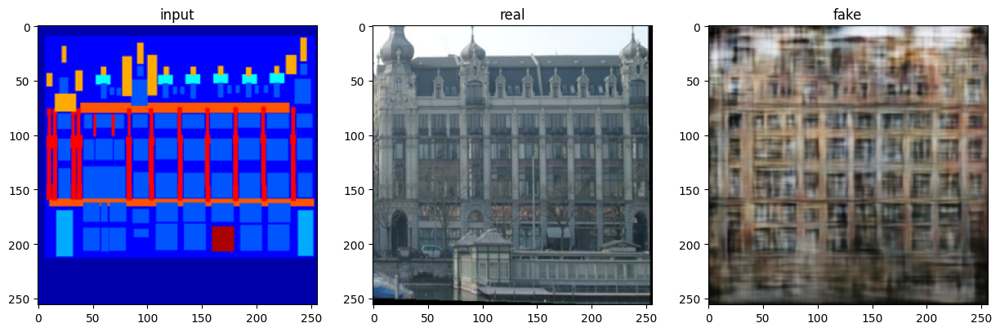

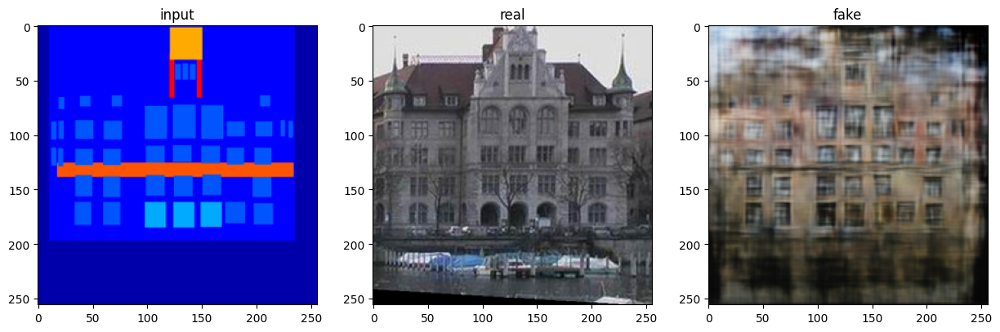

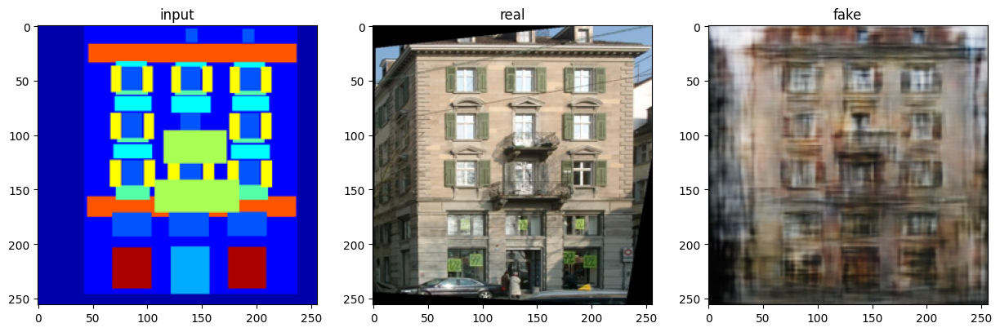

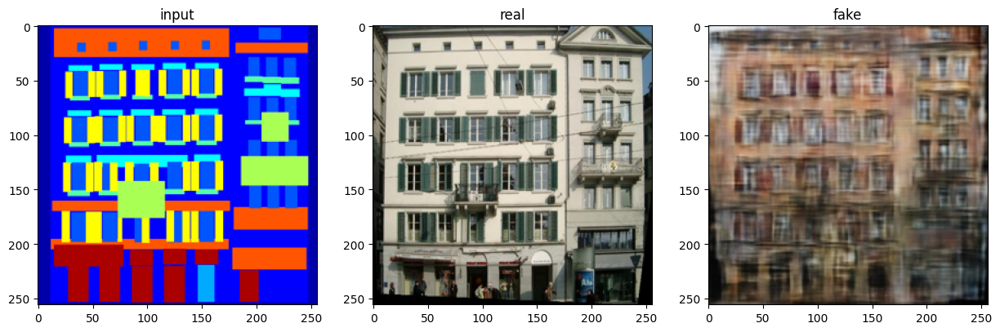

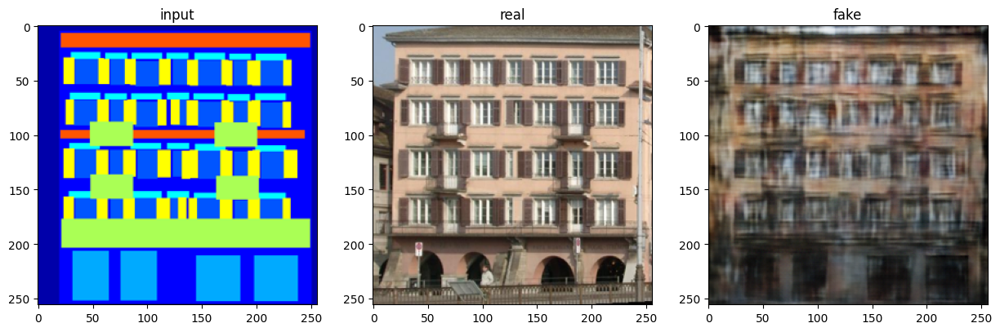

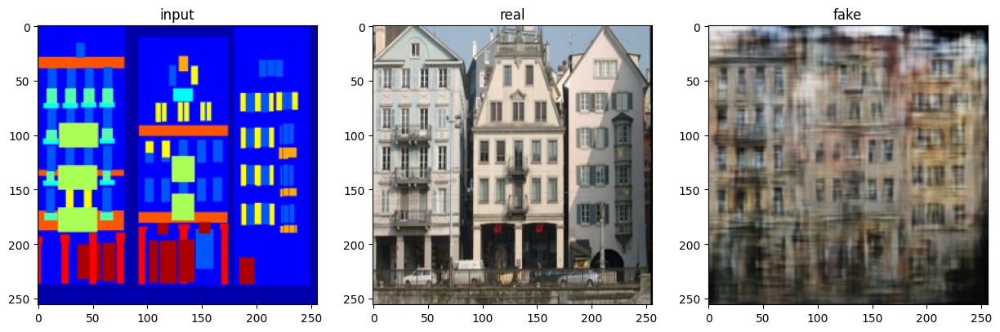

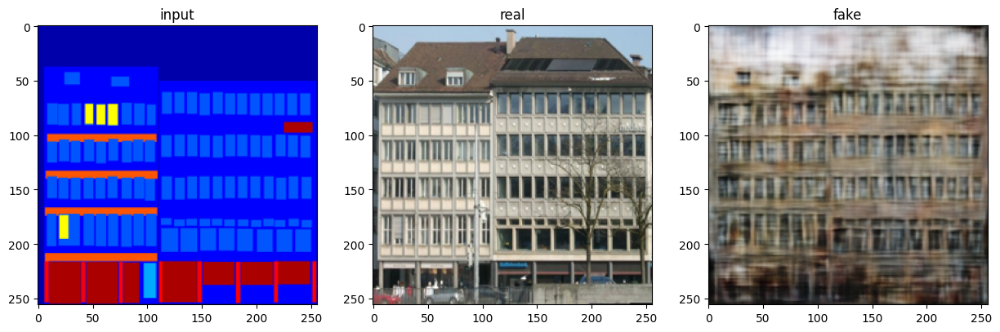

In [ ]:
# show a sample evaluation image on the validation base
image, mask = next(iter(val_dataloader))
output = generator(mask.to(device))
output = output.cpu().detach()

for i in range(8):
    image_plot = reverse_transform(image[i])
    output_plot = reverse_transform(output[i])
    mask_plot = reverse_transform(mask[i])
    plot2x3Array(mask_plot,image_plot,output_plot)

# Part 3: Diffusion

Diffusion models are probabilistic generative models which learn to generate data by iteratively refining random noise through a reverse diffusion process. Given a sample of data, noise is progressvely added in small steps until it becomes pure noise. Then, a neural network is trained to reverse this process and generate realistic data from noise.  

<p align="center">
<img height=300px src="https://substackcdn.com/image/fetch/f_auto,q_auto:good,fl_progressive:steep/https%3A%2F%2Fsubstack-post-media.s3.amazonaws.com%2Fpublic%2Fimages%2F2f5d7da7-52db-4104-9742-a0b4555d8dd6_1300x387.png"/></p>
<p align="center"></p>

Diffusion models have gained popularity due to their ability to generate high-quality, diverse, and detailed content, surpassing GANs in the quality of the generated images.  

Here we will focus on DDPMs, which were introduced in this [paper](https://arxiv.org/abs/2006.11239) and laid the foundation for generative diffusion models.

For this part, we will use the MNIST dataset, used in part 1

In [ ]:

dataroot = "data/mnist"
image_size = 64
batch_size = 128
workers = 2
torch.set_deterministic_debug_mode(False)



mnist_dataset = dset.MNIST(root=dataroot, download=True, transform=transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
]))

mnist_dataloader = torch.utils.data.DataLoader(mnist_dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

NameError: name 'torch' is not defined

Auxiliary function for plotting images

In [ ]:
def plot1xNArray(images, labels):
    f, axarr = plt.subplots(1, len(images))

    for image, ax, label in zip(images, axarr, labels):
        ax.imshow(image, cmap='gray')
        ax.axis('off')
        ax.set_title(label)

In order to train the model with the diffusion process, we will use a noise scheduler, which will be in charge of the forward diffusion process. The scheduler takes an image, a sample of random noise and a timestep, and return a noisy image for the corresponding timestep. Noise is progressvely added to the image at each timestep, therefore a noisy image at timestep 0 will have barely any noise while a noisy image at the maximum timestep will be basically just noise.  

Let's create a noise scheduler with 1000 max timesteps and visualize some noise images.  

We will use the diffusers library, which provides several tools for training and using diffusion models.  

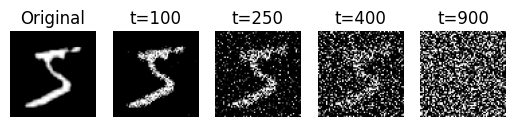

In [ ]:
from diffusers import DDPMScheduler

noise_scheduler = DDPMScheduler(num_train_timesteps = 1000)

image, _ = mnist_dataset[0]

noise = torch.randn_like(image)

images, labels = [reverse_transform(image)], ["Original"]

for i in [100, 250, 400, 900]:
    timestep = torch.LongTensor([i])
    noisy_image = noise_scheduler.add_noise(image, noise, timestep)
    images.append(reverse_transform(noisy_image))
    labels.append(f"t={i}")

plot1xNArray(images, labels)

For the reverse diffusion process we will use a neural network. Given a noisy image and the corresponding timestep, the goal of the neural network is to predict the noise, which allows for the denoising.  

For the model, we will have a similar architecture as we used for the cGAN generator, a 2D UNet with a few modifications. The main difference will be that we have to indicate to the model which timestep is currently being denoised. For that purpose a timestep embedding is added, therefore the model has 2 inputs, the noisy image and the corresponding timestep.  
  
We will use an UNet implementation from the diffusers library, which already has the timestep embedding included.

In [ ]:
from diffusers import UNet2DModel

diffusion_backbone = UNet2DModel(
                        block_out_channels=(64, 128, 256, 512),
                        down_block_types=("DownBlock2D", "DownBlock2D", "DownBlock2D", "DownBlock2D"),
                        up_block_types=("UpBlock2D", "UpBlock2D", "UpBlock2D", "UpBlock2D"),
                        sample_size=64,
                        in_channels=1,
                        out_channels=1,
                    ).to(device)

# Optimizer
optimizer = torch.optim.AdamW(diffusion_backbone.parameters(), lr=1e-4)

print(diffusion_backbone)

UNet2DModel(
  (conv_in): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(64, 64, ker

**Differences between CGAN UNet and Diffusion UNet**

While cGAN Unet uses Conv2D layers with a kernel size of 4×4 and stride of 2, which aggressively reduces spatial dimensions and uses ConvTranspose2D for upsampling; the Diffusion UNet uses Conv2D layers with a 3×3 kernel and stride of 1, preserving spatial information more effectively and uses ResNet blocks inside downsampling and upsampling layers.



Now, let's train the model

In [ ]:
# ----------------
#  Training Loop
# ----------------
torch.backends.cudnn.deterministic = False
torch.use_deterministic_algorithms = False


losses = []
num_epochs = 5
print_every = 100

diffusion_backbone.train()

for epoch in range(num_epochs):
    for i, batch in enumerate(mnist_dataloader):
        # Zero the gradients
        optimizer.zero_grad()

        # Send input to device
        images = batch[0].to(device)

        # Generate noisy images, different timestep for each image in the batch
        timesteps = torch.randint(noise_scheduler.config.num_train_timesteps, (images.size(0),), device=device)

        noise = torch.randn_like(images).to(device)
        noisy_images = noise_scheduler.add_noise(images, noise, timesteps)

        # Forward pass
        residual = diffusion_backbone(noisy_images, timesteps).sample

        loss = nn.functional.mse_loss(residual, noise)

        loss.backward()
        optimizer.step()

        # Print stats
        if i % print_every == 0:
            print(f'Epoch [{epoch+1}/{num_epochs}][{i}/{len(mnist_dataloader)}] | loss: {loss.item():6.4f}')

    losses.append(loss.item())
    torch.save(diffusion_backbone.state_dict(), f"diffusion_{epoch+1}.pth")

Epoch [1/5][0/469] | loss: 1.1617
Epoch [1/5][100/469] | loss: 0.0300
Epoch [1/5][200/469] | loss: 0.0166
Epoch [1/5][300/469] | loss: 0.0147
Epoch [1/5][400/469] | loss: 0.0146
Epoch [2/5][0/469] | loss: 0.0132
Epoch [2/5][100/469] | loss: 0.0130
Epoch [2/5][200/469] | loss: 0.0128
Epoch [2/5][300/469] | loss: 0.0100
Epoch [2/5][400/469] | loss: 0.0094
Epoch [3/5][0/469] | loss: 0.0106
Epoch [3/5][100/469] | loss: 0.0084
Epoch [3/5][200/469] | loss: 0.0098
Epoch [3/5][300/469] | loss: 0.0074
Epoch [3/5][400/469] | loss: 0.0100
Epoch [4/5][0/469] | loss: 0.0069
Epoch [4/5][100/469] | loss: 0.0082
Epoch [4/5][200/469] | loss: 0.0065
Epoch [4/5][300/469] | loss: 0.0074
Epoch [4/5][400/469] | loss: 0.0064
Epoch [5/5][0/469] | loss: 0.0067
Epoch [5/5][100/469] | loss: 0.0069
Epoch [5/5][200/469] | loss: 0.0086
Epoch [5/5][300/469] | loss: 0.0074
Epoch [5/5][400/469] | loss: 0.0067


In [ ]:
diffusion_backbone.load_state_dict(torch.load("diffusion_5.pth"))
diffusion_backbone.eval()

UNet2DModel(
  (conv_in): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=64, out_features=256, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=256, out_features=256, bias=True)
  )
  (down_blocks): ModuleList(
    (0): DownBlock2D(
      (resnets): ModuleList(
        (0-1): 2 x ResnetBlock2D(
          (norm1): GroupNorm(32, 64, eps=1e-05, affine=True)
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (time_emb_proj): Linear(in_features=256, out_features=64, bias=True)
          (norm2): GroupNorm(32, 64, eps=1e-05, affine=True)
          (dropout): Dropout(p=0.0, inplace=False)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (nonlinearity): SiLU()
        )
      )
      (downsamplers): ModuleList(
        (0): Downsample2D(
          (conv): Conv2d(64, 64, ker

Time to generate some images.  

During training, for each data sample, we take a random timestep and correspondent noisy image to give it as input to our model. With suffitient training, the model should learn how to predict the noise in a noisy image for all possible timesteps.  

During inference, to generate an image, we will start from pure noise and step by step predict the noise to go from one noisy image to the next, progressively denoising the image until we reach the timestep 0, in which we should have an image without any noise.

100%|██████████| 1000/1000 [00:57<00:00, 17.50it/s]


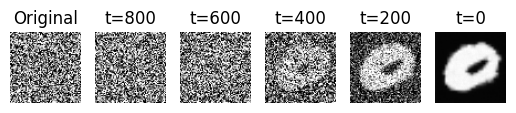

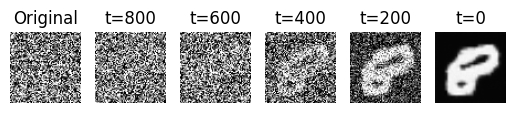

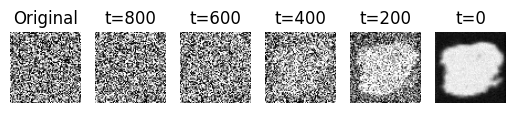

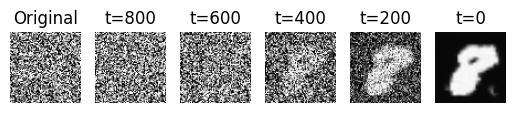

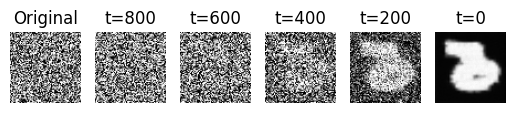

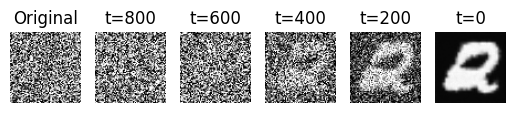

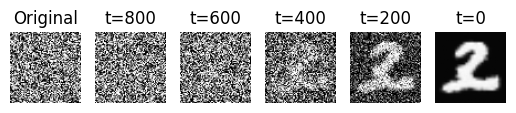

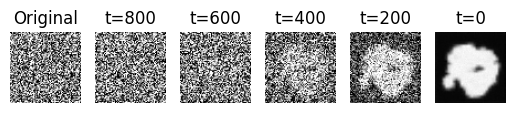

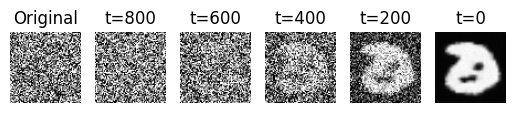

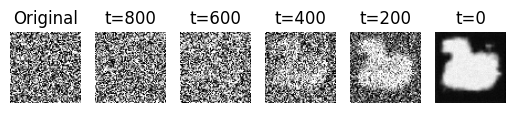

In [ ]:
from tqdm import tqdm

# Start the image as random noise
image = torch.randn((10, 1, 64, 64)).to(device)

# Create a list of images and labels for visualization
images, labels = [(image / 2 + 0.5).clamp(0, 1).cpu().permute(0, 2, 3, 1).numpy()], ["Original"]

# Use the scheduler to iterate over timesteps
noise_scheduler.set_timesteps(1000)

for timestep in tqdm(noise_scheduler.timesteps):
    with torch.no_grad():
        residual = diffusion_backbone(image, timestep).sample
        image = noise_scheduler.step(residual, timestep, image).prev_sample

    if timestep.item() % 200 == 0:
        images.append((image / 2 + 0.5).clamp(0, 1).cpu().permute(0, 2, 3, 1).numpy())
        labels.append(f"t={timestep.item()}")

for i in range(images[0].shape[0]):
    plot1xNArray([img[i] for img in images], labels)

The diffusers library also provides *Pipeline* classes, which are wrappers around the model that abstracts the inference loop implemented above.  
  
We can create a pipeline, giving it the trained model and the noise scheduler, and use it to generate images. In this case, we will only have access to the final image, generated on the last timestep, but not the intermediary images from the denoising process.  

  0%|          | 0/1000 [00:00<?, ?it/s]

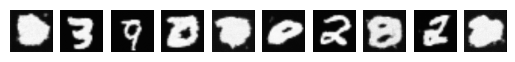

In [ ]:
from diffusers import DDPMPipeline

pipeline = DDPMPipeline(diffusion_backbone, noise_scheduler)
generated_images = pipeline(10, output_type="np")

f, axarr = plt.subplots(1, len(generated_images["images"]))

for image, ax in zip(generated_images["images"], axarr):
    ax.imshow(image, cmap='gray')
    ax.axis('off')